All the data for this project comes kaggle state farm distracted driver competition. https://www.kaggle.com/c/state-farm-distracted-driver-detection/overview

This project uses Mask RCNN to automate the driver detection bounding box to crop out the driver image. Please see the following article https://towardsdatascience.com/computer-vision-instance-segmentation-with-mask-r-cnn-7983502fcad1. 

After cropping the driver image, the approach and the code from the following article was used.https://towardsdatascience.com/distracted-driver-detection-using-deep-learning-e893715e02a4

The combination of the above 2 approaches placed the submission in top 11% of the kaggle leaderboard competition.

Without using the Mask RCNN my submission was in the top 15%. 

Mask RCNN worked quite well on 99%+ images. There were few instances where the results of the cropped image were not optimal. We discuss one such image below.


In [15]:
# import the necessary packages
from mrcnn.config import Config
from mrcnn import model as modellib
from mrcnn import visualize
from mrcnn.visualize import display_instances
import mrcnn
import numpy as np
import colorsys
import argparse
import imutils
import random
import cv2
import os
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
%matplotlib inline

In [16]:
class myMaskRCNNConfig(Config):
    # give the configuration a recognizable name
    NAME = "MaskRCNN_inference"
    
    # set the number of GPUs to use along with the number of images
    # per GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    
    # number of classes (we would normally add +1 for the background
    # but the background class is *already* included in the class
    # names)
    NUM_CLASSES = 1+80

In [17]:
#!pip show tensorflow

In [18]:
config = myMaskRCNNConfig()

In [19]:
import tensorflow as tf
print(tf.__version__)

2.2.0


In [20]:
print("loading weights for Mask R-CNN model…")
model = modellib.MaskRCNN(mode="inference", config=config, model_dir="./")

loading weights for Mask R-CNN model…


In [21]:
model.load_weights('mask_rcnn_coco.h5', by_name=True)

In [22]:
class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
 'bus', 'train', 'truck', 'boat', 'traffic light',
 'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
 'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
 'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
 'kite', 'baseball bat', 'baseball glove', 'skateboard',
 'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
 'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
 'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
 'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
 'teddy bear', 'hair drier', 'toothbrush']

In [23]:
# draw an image with detected objects

def draw_image_with_boxes(filename, boxes_list):
    # load the image
    data = plt.imread(filename)
    
    # plot the image
    plt.imshow(data)
    # get the context for drawing boxes
    ax = plt.gca()
    # plot each box
    for box in boxes_list:
         # get coordinates
         y1, x1, y2, x2 = box
         # calculate width and height of the box
         width, height = x2 - x1, y2 - y1
         # create the shape
         rect = Rectangle((x1, y1), width, height, fill=False, color='red', lw=5)
         # draw the box
         ax.add_patch(rect)
    # show the plot
    plt.show()

Show an image with bounding box, and instance for a few samples. Point out what works and what doesnt

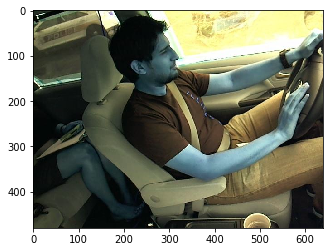

In [30]:
im = cv2.imread("img_1005.jpg")
plt.imshow(im)


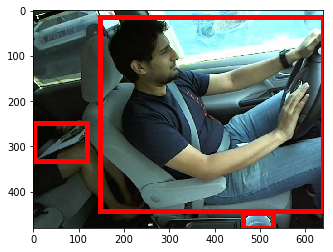

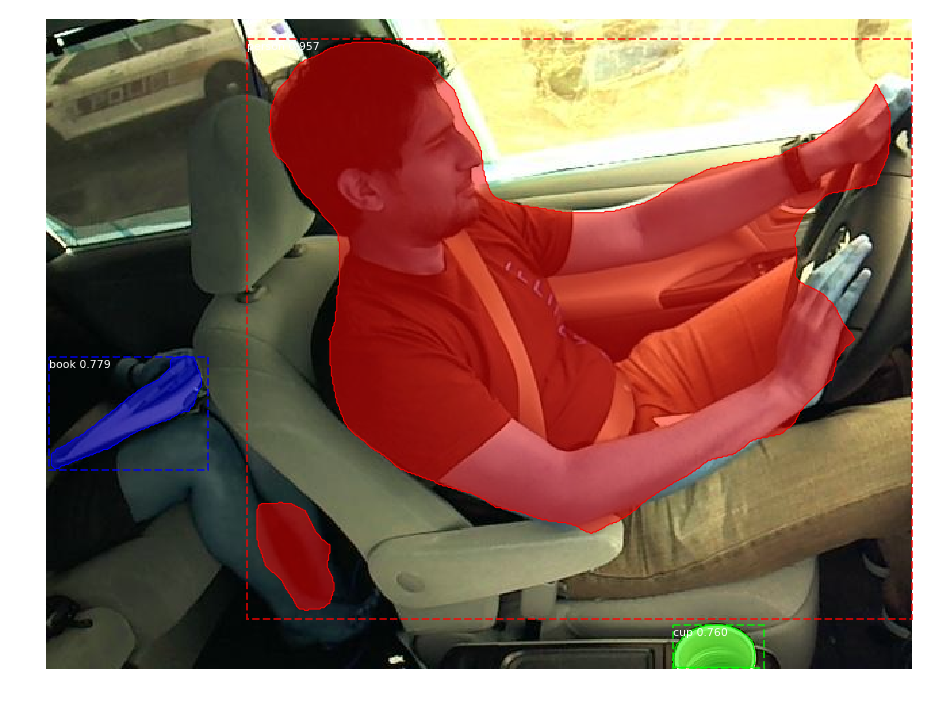

In [31]:
results = model.detect([im], verbose=0)
r = results[0]
# visualize the results
# notice 2 persons are detected. We will extract the larger box corresponding to the driver 
draw_image_with_boxes("img_1005.jpg", r['rois']) 
display_instances(im, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

Mask RCNN doesnt always work. In the image below the same person is found multiple times. Head and torso is in one bounding box, and arms and legs are in another bounding box. 

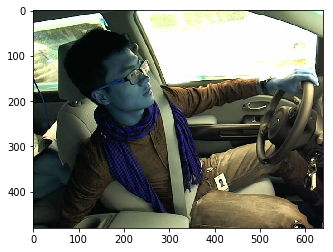

In [32]:
im = cv2.imread("img_62010.jpg")
plt.imshow(im)

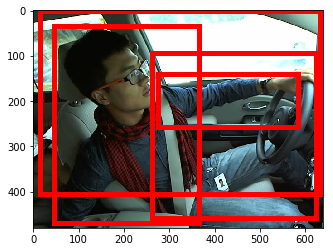

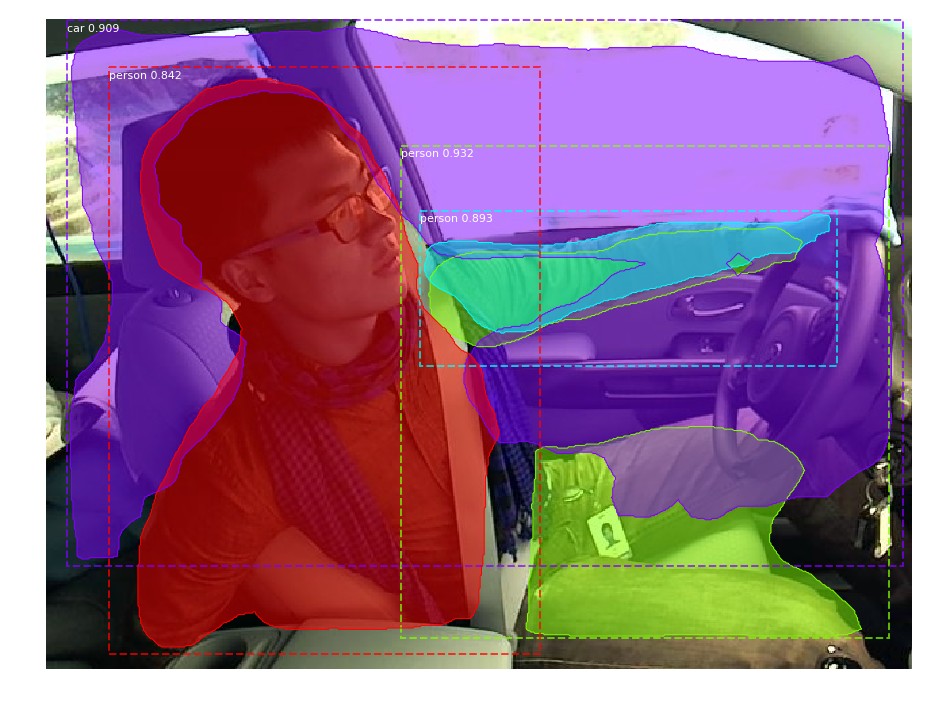

In [33]:
results = model.detect([im], verbose=0)
r = results[0]
# visualize the results
draw_image_with_boxes("img_62010.jpg", r['rois'])
display_instances(im, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

In the script below, the first row contains the original image, and the second row contains the zoomed in image.

For purposes of training we will use the zoomed in image. We will pick the largest bounding box around the person, and crop that image. We will see that by focusing on the person we get better results.
Mask RCNN helps us automate the cropping aspect.

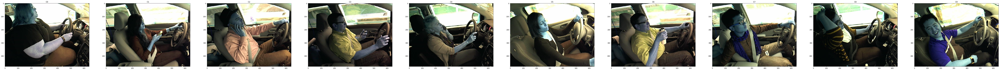

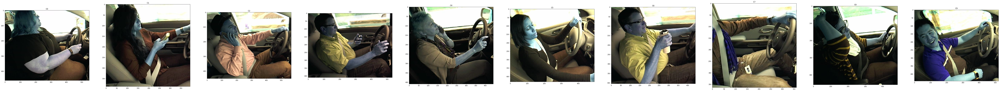

In [35]:
# getting one image per label
f, ax = plt.subplots(1,10, figsize = (120,120))

for i in range(10):
  
    images = os.listdir("../state-farm-distracted-driver-detection/imgs/train/c"+str(i))
    for j in range(1):
        img_name = "../state-farm-distracted-driver-detection/imgs/train/c"+str(i)+"/"+images[j]
        label = i
        img = cv2.imread(img_name)
        ax[i].imshow(img)
        ax[i].set_title('C'+str(i))
        plt.show


# After running Mask RCNN
f, ax = plt.subplots(1,10, figsize = (120,120))
for i in range(10):
    images = os.listdir("../state-farm-distracted-driver-detection/imgs/train/c"+str(i))
    for j in range(1):
        img_name = "../state-farm-distracted-driver-detection/imgs/train/c"+str(i)+"/"+images[j]
        label = i
        
        img = cv2.imread(img_name)
        # find objects 
        results = model.detect([img], verbose=0)
        r = results[0]

        # find the index corresponding to person
        classes= r['class_ids']
        idx = y1 = y2 = x1 = x2 = 0
        for k in range(len(classes)):
            if (class_names[classes[k]] == 'person'):
                idx = k
                # get the bounding box for the largest person in the image
                y1, x1, y2, x2 = r['rois'][idx]
                break

        # extract the largest box associated with the person in the image
        # visualize the results
        # notice that sometimes the full person is not extracted (class 7), 8th column
        # for now we will stay with such errors
        img = img[y1:y2,x1:x2]
        
        ax[i].imshow(img,cmap='gray')
        ax[i].set_title('C'+str(i))
        plt.show


Generate zoomed images for training. Please see gen_train.py

Generate zoomed images for testing. Please see gen_test.py. Both gen_test.py and gen_train.py are very similar and should be merged. The only difference is in the directory structure.

Both gen_train.py and gen_test.py were run on AWS EC2 instance. The processed jpg images 

Load the zoomed images and corresponding labels into X_train, X_test, y_train and y_test. We are first pickling the images and then doing the load into train_image list and subsequently creating a numpy array.

In [ ]:
# read the provided csv.
driver_details = pd.read_csv('/content/drive/My Drive/kaggle/driver_imgs_list.csv',na_values='na')

In [ ]:
count = 0
append_count = 0

# images returned from os.listdir are the preprocessed images in the above step
# here we are saving pickled images
for i in range(10):
    print('now we are in the folder C',i)
    train_image = []
    image_label = []
    imgs = os.listdir("/content/drive/My Drive/distdrv/zoomtrain/zoom/c"+str(i))
    print(f'num images = {len(imgs)}')
    for j in range(len(imgs)):
      img_name = "/content/drive/My Drive/distdrv/zoomtrain/zoom/c"+str(i)+"/"+imgs[j]
      img = cv2.imread(img_name)
      label = i
      driver = driver_details[driver_details['img'] == imgs[j]]['subject'].values[0]
      append_count += 1
      train_image.append([img,label,driver])
      image_label.append(i)
    
    # dump to a pickle file
    filename = "/content/drive/My Drive/distdrv/cache/zoommask_r_224_c_224_c_3_class" + str(i) + ".dat"
    print(f'filename = {filename}, train_image = {len(train_image)}')
    file = open(filename, 'wb')
    pickle.dump((train_image, image_label), file)
    file.close()


Train various models (VGG16, Mobilnet, Resnet50, Xception)


For training with VGG16 refer to vgg16.ipynb. 
For training with Mobilenet refer to mobilenet.ipynb
For training with Resnet50 refer to resnet50.ipynb
For training with Xception refer to xception.ipynb

For generating predictions for each model refer to modelpreds.ipynb

For final ensemble predictions (the one submitted for kaggle) refer to finalpreds.ipynb